In [1]:
from torchvision import transforms
from torch.utils.data import Dataset
from PIL import Image
import os

class PatchDataset(Dataset):
    def __init__(self, blurry_dir, sharp_dir, max_samples=None):
        self.blurry_paths = sorted(os.listdir(blurry_dir))[:max_samples]
        self.sharp_paths = sorted(os.listdir(sharp_dir))[:max_samples]
        self.blurry_dir = blurry_dir
        self.sharp_dir = sharp_dir
        self.transform = transforms.Compose([
            transforms.ToTensor()
        ])

    def __len__(self):
        return len(self.blurry_paths)

    def __getitem__(self, idx):
        blurry = Image.open(os.path.join(self.blurry_dir, self.blurry_paths[idx])).convert("RGB")
        sharp = Image.open(os.path.join(self.sharp_dir, self.sharp_paths[idx])).convert("RGB")
        return self.transform(blurry), self.transform(sharp)

In [4]:
def get_weights_and_parameters(task, parameters):
    if task == 'Motion_Deblurring':
        weights = '/kaggle/input/res-kaggle/Restormer/Motion_Deblurring/pretrained_models/motion_deblurring.pth'
    elif task == 'Single_Image_Defocus_Deblurring':
        weights = '/kaggle/input/rest-kaggle/Restormer/Defocus_Deblurring/pretrained_models/single_image_defocus_deblurring.pth'
    else:
        raise ValueError(f"Unsupported task: {task}")
    return weights, parameters

In [ ]:
import os
import torch
from runpy import run_path

restormer_arch_path = '/kaggle/input/res-kaggle/Restormer/basicsr/models/archs/restormer_arch.py'
load_arch = run_path(restormer_arch_path)
Restormer = load_arch['Restormer']

parameters = {
    'inp_channels': 3,
    'out_channels': 3,
    'dim': 48,
    'num_blocks': [4, 6, 6, 8],
    'num_refinement_blocks': 4,
    'heads': [1, 2, 4, 8],
    'ffn_expansion_factor': 2.66,
    'bias': False,
    'LayerNorm_type': 'WithBias',
    'dual_pixel_task': False
}

model_path = '/kaggle/input/motion-deblurring/Motion_Deblurring/pretrained_models/motion_deblurring.pth'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = Restormer(**parameters)
checkpoint = torch.load(model_path, map_location=device)

model.load_state_dict(checkpoint['params'] if 'params' in checkpoint else checkpoint)
model = model.to(device)

In [6]:
teacher_model=model
teacher_model.eval().to(device)

Restormer(
  (patch_embed): OverlapPatchEmbed(
    (proj): Conv2d(3, 48, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  )
  (encoder_level1): Sequential(
    (0): TransformerBlock(
      (norm1): LayerNorm(
        (body): WithBias_LayerNorm()
      )
      (attn): Attention(
        (qkv): Conv2d(48, 144, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (qkv_dwconv): Conv2d(144, 144, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=144, bias=False)
        (project_out): Conv2d(48, 48, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
      (norm2): LayerNorm(
        (body): WithBias_LayerNorm()
      )
      (ffn): FeedForward(
        (project_in): Conv2d(48, 254, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (dwconv): Conv2d(254, 254, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=254, bias=False)
        (project_out): Conv2d(127, 48, kernel_size=(1, 1), stride=(1, 1), bias=False)
      )
    )
    (1): TransformerBlock(
 

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class GroupedChannelAttention(nn.Module):
    def __init__(self, channels, groups=4):
        super().__init__()
        self.groups = groups
        self.group_channels = channels // groups
        self.conv = nn.Conv2d(self.group_channels, self.group_channels, 3,
                              padding=1, groups=self.group_channels)
        self.attention = nn.Sequential(
            nn.AdaptiveAvgPool2d(1),
            nn.Conv2d(self.group_channels, self.group_channels // 4, 1, bias=False),
            nn.ReLU(),
            nn.Conv2d(self.group_channels // 4, self.group_channels, 1, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, h, w = x.size()
        grouped = x.reshape(b * self.groups, self.group_channels, h, w)
        features = self.conv(grouped)
        attn = self.attention(features)
        return (features * attn).reshape(b, c, h, w)


class GatedFFN(nn.Module):
    def __init__(self, dim, expansion=0.5):
        super().__init__()
        hidden = int(dim * expansion)
        self.project_in = nn.Conv2d(dim, hidden, 1)
        self.dwconv = nn.Conv2d(hidden, hidden, 3, padding=1, groups=hidden)
        self.gate = nn.Conv2d(hidden, hidden, 1)
        self.project_out = nn.Conv2d(hidden, dim, 1)

    def forward(self, x):
        x = self.project_in(x)
        x1 = self.dwconv(x)
        x2 = self.gate(x)
        x = F.relu(x1) * torch.sigmoid(x2)
        return self.project_out(x)


class RestormerBlock(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.attn_norm = nn.LayerNorm(dim)
        self.attn = GroupedChannelAttention(dim)
        self.ffn_norm = nn.LayerNorm(dim)
        self.ffn = GatedFFN(dim)

    def forward(self, x):
        identity = x
        x = x.permute(0, 2, 3, 1) 
        x_norm = self.attn_norm(x)
        x_norm = x_norm.permute(0, 3, 1, 2) 
        x_attn = self.attn(x_norm)
        x_attn = x_attn + identity

        identity = x_attn
        x_attn = x_attn.permute(0, 2, 3, 1)
        x_norm = self.ffn_norm(x_attn)
        x_norm = x_norm.permute(0, 3, 1, 2)
        x_out = self.ffn(x_norm)
        return x_out + identity


class StudentModel(nn.Module):
    def __init__(self):
        super().__init__()

        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 64, 3, padding=1),
            *[RestormerBlock(64) for _ in range(2)]
        )
        self.down1 = nn.Conv2d(64, 128, 3, stride=2, padding=1)

        self.enc2 = nn.Sequential(
            *[RestormerBlock(128) for _ in range(2)]
        )
        self.down2 = nn.Conv2d(128, 256, 3, stride=2, padding=1)

        self.enc3 = nn.Sequential(
            *[RestormerBlock(256) for _ in range(2)]
        )

       
        self.up2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(256, 128, 1)
        )
        self.dec2 = nn.Sequential(
            nn.Conv2d(256, 128, 3, padding=1), 
            *[RestormerBlock(128) for _ in range(2)]
        )

        self.up1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True),
            nn.Conv2d(128, 64, 1)
        )
        self.dec1 = nn.Sequential(
            nn.Conv2d(128, 64, 3, padding=1), 
            *[RestormerBlock(64) for _ in range(2)]
        )

        self.final = nn.Conv2d(64, 3, 1)

        self.proj_enc1 = nn.Conv2d(64, 48, 1)   
        self.proj_enc2 = nn.Conv2d(128, 96, 1)  
        self.proj_enc3 = nn.Conv2d(256, 192, 1)
        self.proj_dec1 = nn.Conv2d(64, 96, 1)   
        self.proj_dec2 = nn.Conv2d(128, 96, 1)  
        self.proj_latent = nn.Conv2d(256, 192, 1)

    def forward(self, x, return_features=False):
        out_enc1 = self.enc1(x)                       
        x_down1 = self.down1(out_enc1)              

        out_enc2 = self.enc2(x_down1)                
        x_down2 = self.down2(out_enc2)               

        out_enc3 = self.enc3(x_down2)                 

        up2 = self.up2(out_enc3)                    
        dec2_input = torch.cat([up2, out_enc2], dim=1)  
        out_dec2 = self.dec2(dec2_input)            

        up1 = self.up1(out_dec2)                     
        dec1_input = torch.cat([up1, out_enc1], dim=1)
        out_dec1 = self.dec1(dec1_input)         

        out = self.final(out_dec1) + x            

        if return_features:
            return out, {
                "enc1": self.proj_enc1(out_enc1),
                "enc2": self.proj_enc2(out_enc2),
                "enc3": self.proj_enc3(out_enc3),
                "dec1": self.proj_dec1(out_dec1),
                "dec2": self.proj_dec2(out_dec2),
                "latent": self.proj_latent(out_enc3)
            }

        return out

In [9]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [10]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
from torchvision import transforms
import numpy as np
import os
import cv2
from skimage.metrics import structural_similarity as ssim
from tqdm import tqdm
import matplotlib.pyplot as plt

In [11]:
student_model = StudentModel().to(device)
optimizer = optim.Adam(student_model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=20, T_mult=2, eta_min=1e-6)

In [ ]:
whole_dataset = PatchDataset(
    blurry_dir="/kaggle/input/gopro-patches/GoPro_patches/input",
    sharp_dir="/kaggle/input/gopro-patches/GoPro_patches/target",
    max_samples=7500
)

In [ ]:
from torch.utils.data import random_split, DataLoader

total_len = len(whole_dataset)
train_val_len = int(0.9 * total_len)
benchmark_len = total_len - train_val_len

train_val_dataset, benchmark_dataset = random_split(whole_dataset, [train_val_len, benchmark_len])

train_len = int(0.8 * train_val_len)
test_len = train_val_len - train_len
train_dataset, test_dataset = random_split(train_val_dataset, [train_len, test_len])

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
benchmark_loader = DataLoader(benchmark_dataset, batch_size=32, shuffle=False)

In [ ]:
from skimage.metrics import structural_similarity as ssim
import numpy as np

def calculate_ssim_batch(pred, target):
    pred_np = pred.permute(0, 2, 3, 1).detach().cpu().numpy()
    target_np = target.permute(0, 2, 3, 1).detach().cpu().numpy()
    ssims = []
    for i in range(pred_np.shape[0]):
        ssim_val = ssim(pred_np[i], target_np[i], channel_axis=-1, data_range=1.0)
        ssims.append(ssim_val)
    return np.mean(ssims)

In [15]:
pip install pytorch-msssim

Note: you may need to restart the kernel to use updated packages.


In [17]:
import torchvision.models as models

class VGGPerceptualLoss(nn.Module):
    def __init__(self, resize=False):
        super().__init__()
        blocks = []
        blocks.append(models.vgg16(pretrained=True).features[:4].eval())
        blocks.append(models.vgg16(pretrained=True).features[4:9].eval())
        for bl in blocks:
            for p in bl.parameters():
                p.requires_grad = False
        self.blocks = torch.nn.ModuleList(blocks)
        self.transform = torch.nn.functional.interpolate if resize else lambda x: x

    def forward(self, input, target):
        input = self.transform(input)
        target = self.transform(target)
        loss = 0.0
        x = input
        y = target
        for block in self.blocks:
            x = block(x)
            y = block(y)
            loss += torch.nn.functional.l1_loss(x, y)
        return loss

Train batches: 169
Validation batches: 43
Benchmark batches: 24


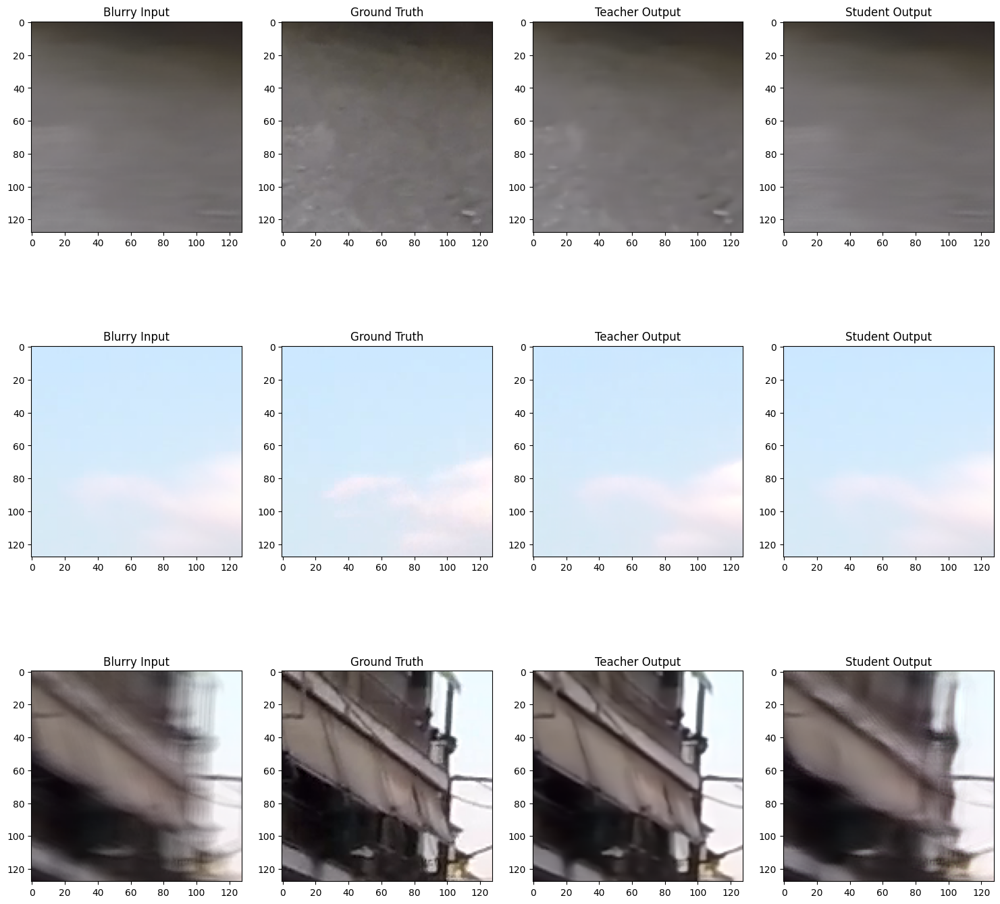


Epoch [1/100] | Time: 723.13s
  Train - Loss: 0.1306, SSIM: 0.8441, PSNR: 25.85 dB
  Val   - Loss: 0.1272, SSIM: 0.8498, PSNR: 26.06 dB
  LR: 0.000300
  --> New best validation SSIM: 0.8498

Epoch [2/100] | Time: 704.21s
  Train - Loss: 0.1283, SSIM: 0.8487, PSNR: 26.04 dB
  Val   - Loss: 0.1266, SSIM: 0.8517, PSNR: 26.05 dB
  LR: 0.000300
  --> New best validation SSIM: 0.8517

Epoch [3/100] | Time: 704.47s
  Train - Loss: 0.1268, SSIM: 0.8515, PSNR: 26.14 dB
  Val   - Loss: 0.1254, SSIM: 0.8524, PSNR: 26.13 dB
  LR: 0.000300
  --> New best validation SSIM: 0.8524

Epoch [4/100] | Time: 713.17s
  Train - Loss: 0.1256, SSIM: 0.8539, PSNR: 26.24 dB
  Val   - Loss: 0.1245, SSIM: 0.8548, PSNR: 26.23 dB
  LR: 0.000299
  --> New best validation SSIM: 0.8548

Epoch [5/100] | Time: 710.65s
  Train - Loss: 0.1249, SSIM: 0.8554, PSNR: 26.33 dB
  Val   - Loss: 0.1244, SSIM: 0.8554, PSNR: 26.23 dB
  LR: 0.000299
  --> New best validation SSIM: 0.8554

Epoch [6/100] | Time: 721.81s
  Train - Loss

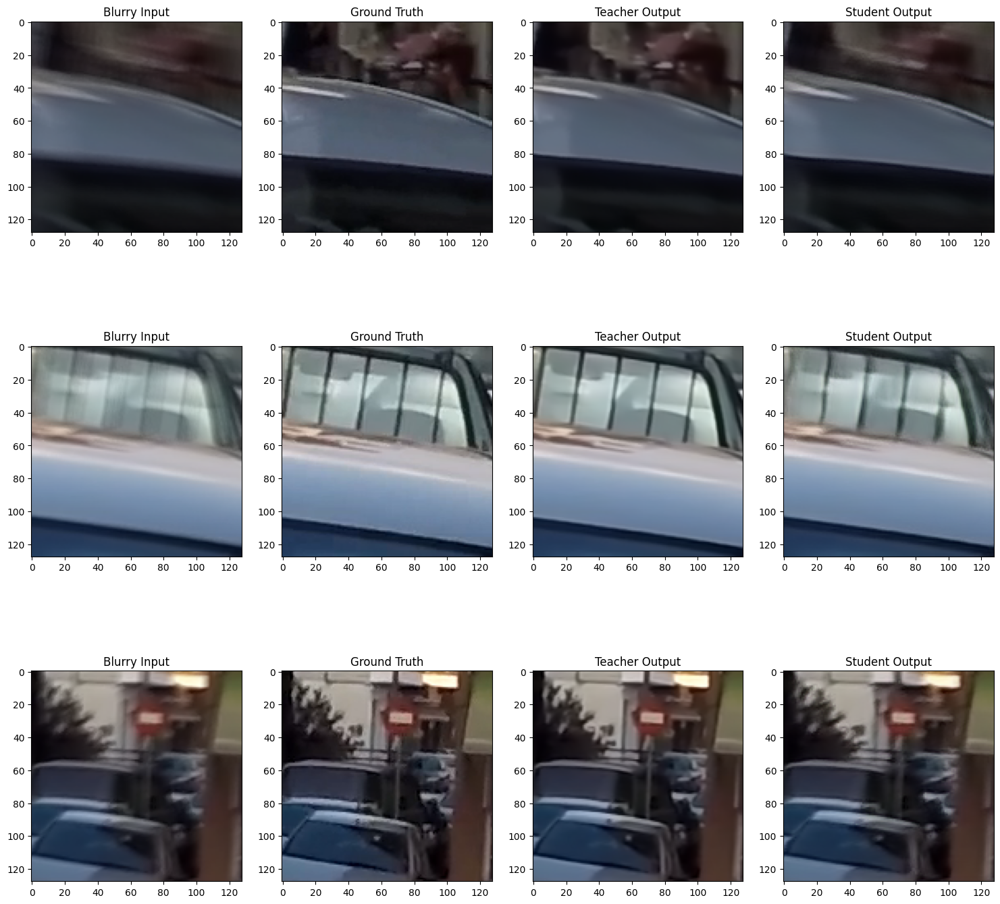


Epoch [11/100] | Time: 730.22s
  Train - Loss: 0.1198, SSIM: 0.8652, PSNR: 26.73 dB
  Val   - Loss: 0.1215, SSIM: 0.8605, PSNR: 26.35 dB
  LR: 0.000293
  --> New best validation SSIM: 0.8605

Epoch [12/100] | Time: 724.21s
  Train - Loss: 0.1193, SSIM: 0.8663, PSNR: 26.78 dB
  Val   - Loss: 0.1206, SSIM: 0.8610, PSNR: 26.51 dB
  LR: 0.000291
  --> New best validation SSIM: 0.8610

Epoch [13/100] | Time: 720.61s
  Train - Loss: 0.1186, SSIM: 0.8678, PSNR: 26.84 dB
  Val   - Loss: 0.1203, SSIM: 0.8619, PSNR: 26.53 dB
  LR: 0.000289
  --> New best validation SSIM: 0.8619

Epoch [14/100] | Time: 726.08s
  Train - Loss: 0.1180, SSIM: 0.8688, PSNR: 26.88 dB
  Val   - Loss: 0.1197, SSIM: 0.8639, PSNR: 26.58 dB
  LR: 0.000288
  --> New best validation SSIM: 0.8639

Epoch [15/100] | Time: 732.09s
  Train - Loss: 0.1172, SSIM: 0.8703, PSNR: 26.97 dB
  Val   - Loss: 0.1199, SSIM: 0.8631, PSNR: 26.57 dB
  LR: 0.000286
  Patience counter: 1/10

Epoch [16/100] | Time: 721.56s
  Train - Loss: 0.1167

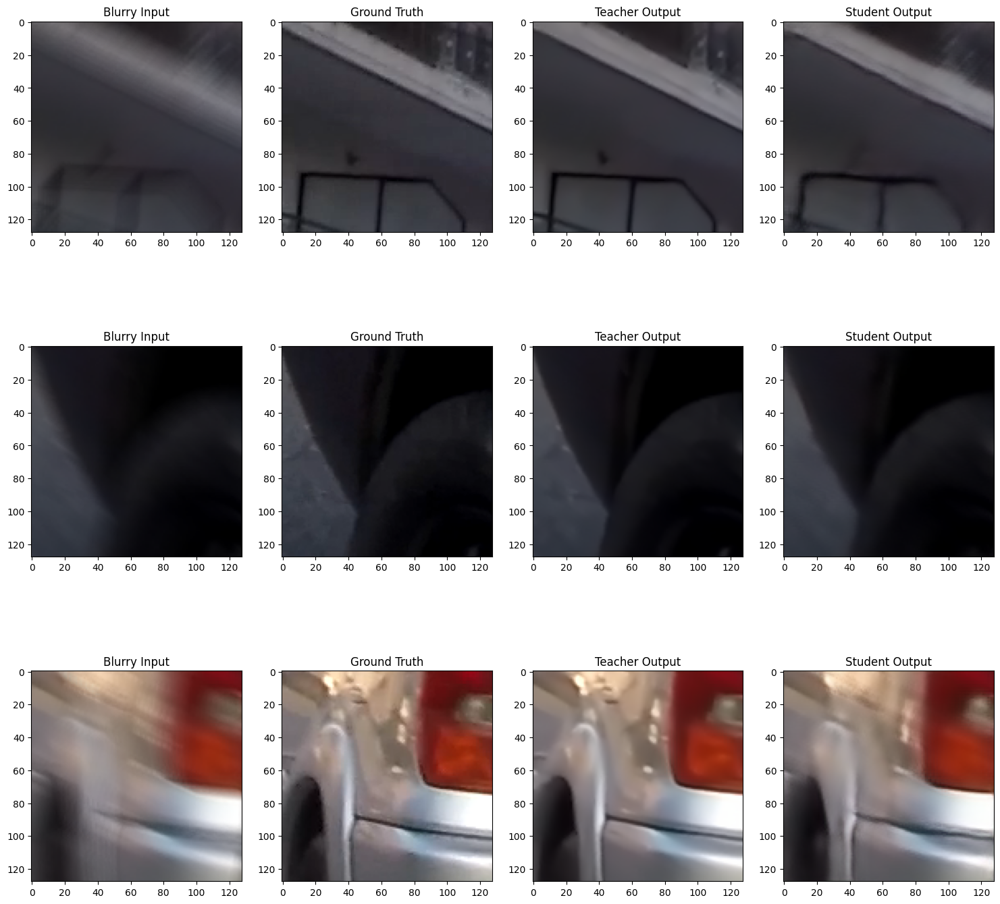


Epoch [21/100] | Time: 744.29s
  Train - Loss: 0.1138, SSIM: 0.8770, PSNR: 27.30 dB
  Val   - Loss: 0.1177, SSIM: 0.8665, PSNR: 26.72 dB
  LR: 0.000271
  Patience counter: 1/10

Epoch [22/100] | Time: 723.82s
  Train - Loss: 0.1135, SSIM: 0.8775, PSNR: 27.32 dB
  Val   - Loss: 0.1178, SSIM: 0.8669, PSNR: 26.70 dB
  LR: 0.000269
  --> New best validation SSIM: 0.8669

Epoch [23/100] | Time: 720.30s
  Train - Loss: 0.1131, SSIM: 0.8783, PSNR: 27.36 dB
  Val   - Loss: 0.1166, SSIM: 0.8691, PSNR: 26.82 dB
  LR: 0.000266
  --> New best validation SSIM: 0.8691

Epoch [24/100] | Time: 724.28s
  Train - Loss: 0.1123, SSIM: 0.8798, PSNR: 27.43 dB
  Val   - Loss: 0.1165, SSIM: 0.8691, PSNR: 26.86 dB
  LR: 0.000263
  Patience counter: 1/10

Epoch [25/100] | Time: 723.30s
  Train - Loss: 0.1121, SSIM: 0.8803, PSNR: 27.44 dB
  Val   - Loss: 0.1172, SSIM: 0.8676, PSNR: 26.78 dB
  LR: 0.000259
  Patience counter: 2/10

Epoch [26/100] | Time: 728.40s
  Train - Loss: 0.1119, SSIM: 0.8806, PSNR: 27.48 

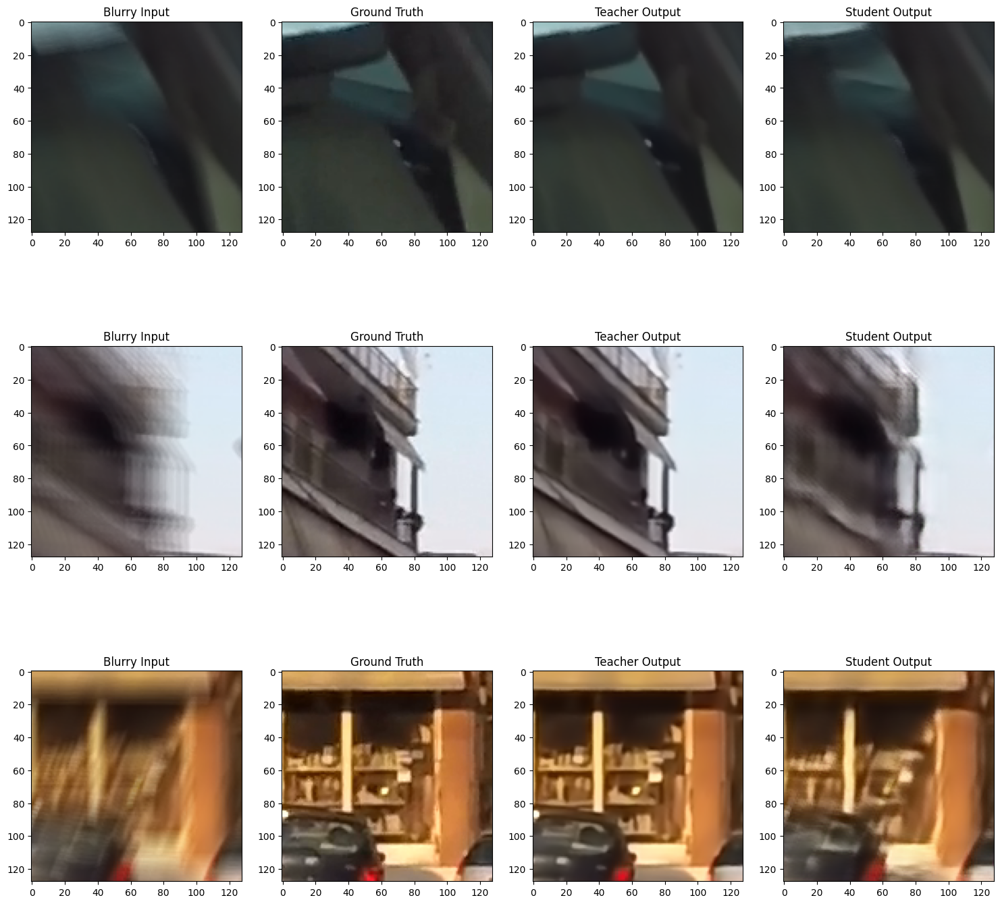


Epoch [31/100] | Time: 731.62s
  Train - Loss: 0.1094, SSIM: 0.8854, PSNR: 27.72 dB
  Val   - Loss: 0.1152, SSIM: 0.8723, PSNR: 26.95 dB
  LR: 0.000238
  Patience counter: 1/10

Epoch [32/100] | Time: 725.19s
  Train - Loss: 0.1089, SSIM: 0.8864, PSNR: 27.80 dB
  Val   - Loss: 0.1141, SSIM: 0.8736, PSNR: 27.04 dB
  LR: 0.000234
  --> New best validation SSIM: 0.8736

Epoch [33/100] | Time: 720.97s
  Train - Loss: 0.1084, SSIM: 0.8873, PSNR: 27.86 dB
  Val   - Loss: 0.1140, SSIM: 0.8740, PSNR: 27.03 dB
  LR: 0.000230
  --> New best validation SSIM: 0.8740

Epoch [34/100] | Time: 735.16s
  Train - Loss: 0.1079, SSIM: 0.8881, PSNR: 27.89 dB
  Val   - Loss: 0.1139, SSIM: 0.8745, PSNR: 27.04 dB
  LR: 0.000226
  --> New best validation SSIM: 0.8745

Epoch [35/100] | Time: 752.41s
  Train - Loss: 0.1075, SSIM: 0.8889, PSNR: 27.96 dB
  Val   - Loss: 0.1142, SSIM: 0.8738, PSNR: 27.04 dB
  LR: 0.000222
  Patience counter: 1/10

Epoch [36/100] | Time: 723.70s
  Train - Loss: 0.1073, SSIM: 0.8893

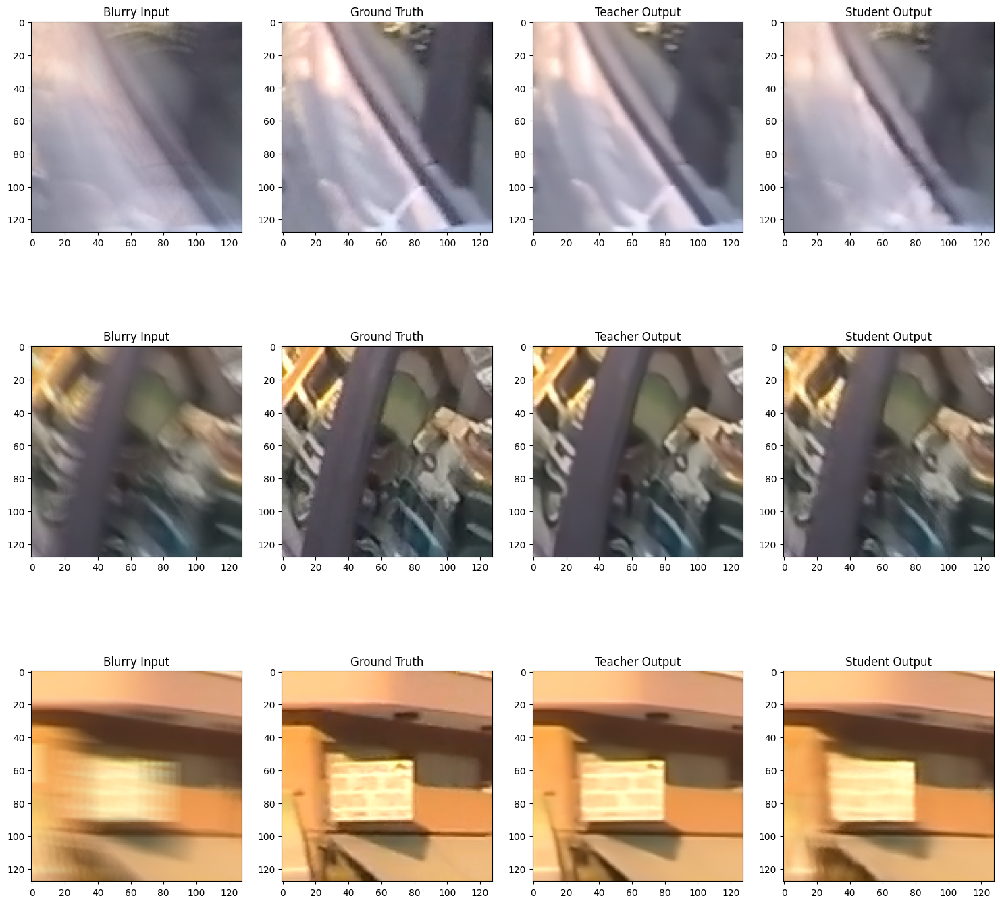


Epoch [41/100] | Time: 731.89s
  Train - Loss: 0.1053, SSIM: 0.8930, PSNR: 28.17 dB
  Val   - Loss: 0.1129, SSIM: 0.8769, PSNR: 27.08 dB
  LR: 0.000196
  --> New best validation SSIM: 0.8769

Epoch [42/100] | Time: 724.15s
  Train - Loss: 0.1047, SSIM: 0.8942, PSNR: 28.26 dB
  Val   - Loss: 0.1123, SSIM: 0.8776, PSNR: 27.18 dB
  LR: 0.000192
  --> New best validation SSIM: 0.8776

Epoch [43/100] | Time: 719.57s
  Train - Loss: 0.1048, SSIM: 0.8940, PSNR: 28.25 dB
  Val   - Loss: 0.1117, SSIM: 0.8786, PSNR: 27.22 dB
  LR: 0.000187
  --> New best validation SSIM: 0.8786

Epoch [44/100] | Time: 720.89s
  Train - Loss: 0.1044, SSIM: 0.8949, PSNR: 28.28 dB
  Val   - Loss: 0.1124, SSIM: 0.8776, PSNR: 27.17 dB
  LR: 0.000183
  Patience counter: 1/10

Epoch [45/100] | Time: 722.11s
  Train - Loss: 0.1040, SSIM: 0.8956, PSNR: 28.33 dB
  Val   - Loss: 0.1114, SSIM: 0.8790, PSNR: 27.26 dB
  LR: 0.000178
  --> New best validation SSIM: 0.8790

Epoch [46/100] | Time: 720.32s
  Train - Loss: 0.1035

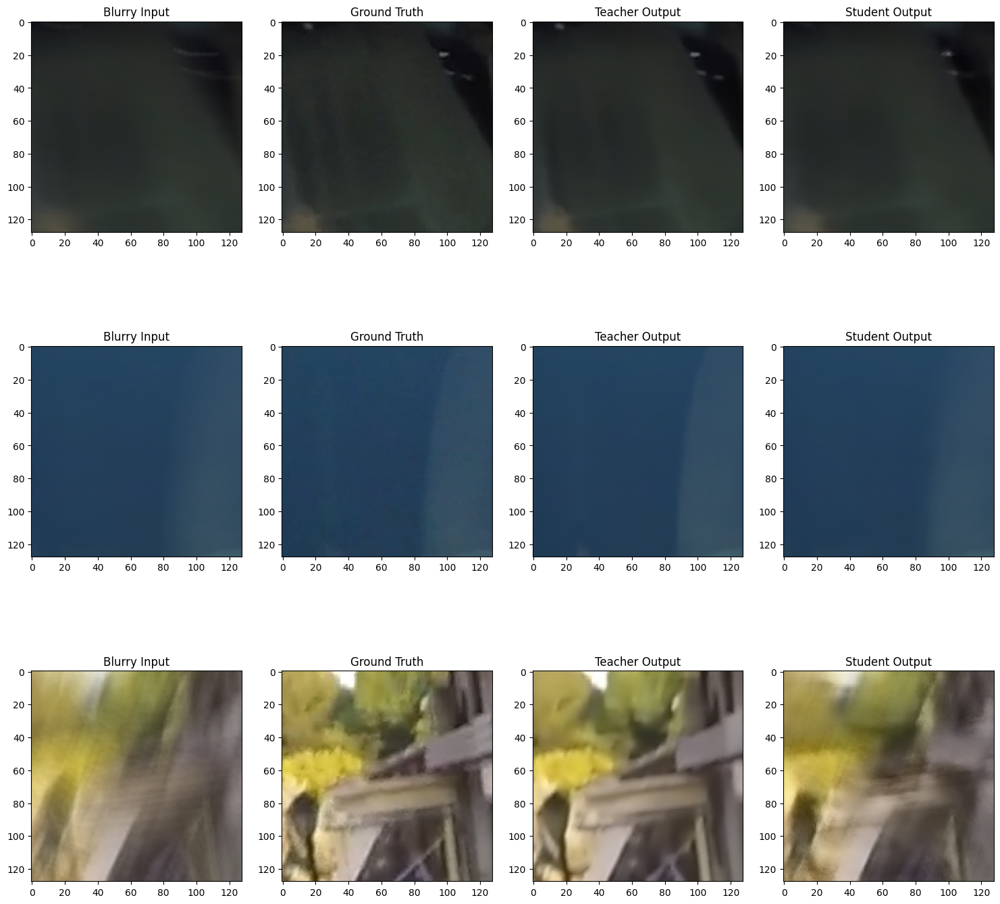

KeyboardInterrupt: 

In [ ]:
import torch
import torch.nn.functional as F
from pytorch_msssim import SSIM
import matplotlib.pyplot as plt
import numpy as np
import time
from torch.utils.data import DataLoader

# Device setup
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ssim_loss = SSIM(data_range=1.0, size_average=True).to(device)
perceptual_loss = VGGPerceptualLoss().to(device)

def gradient_loss(pred, target):
    pred_grad_x = pred[:, :, :, 1:] - pred[:, :, :, :-1]
    pred_grad_y = pred[:, :, 1:, :] - pred[:, :, :-1, :]
    target_grad_x = target[:, :, :, 1:] - target[:, :, :, :-1]
    target_grad_y = target[:, :, 1:, :] - target[:, :, :-1, :]
    return F.l1_loss(pred_grad_x, target_grad_x) + F.l1_loss(pred_grad_y, target_grad_y)

def charbonnier_loss(pred, target, eps=1e-3):
    return torch.mean(torch.sqrt((pred - target) ** 2 + eps ** 2))

def psnr(pred, target, max_val=1.0):
    mse = torch.mean((pred - target) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * torch.log10(max_val / torch.sqrt(mse))

def high_frequency_loss(pred, target):
    pred_hf = pred - F.avg_pool2d(pred, kernel_size=3, stride=1, padding=1)
    target_hf = target - F.avg_pool2d(target, kernel_size=3, stride=1, padding=1)
    return F.l1_loss(pred_hf, target_hf)

def visualize_results(blurry, sharp, teacher_out, student_out, num_samples=3):
    plt.figure(figsize=(15, 5*num_samples))
    for i in range(num_samples):
        plt.subplot(num_samples, 4, 4*i+1)
        plt.imshow(blurry[i].permute(1,2,0).cpu().numpy())
        plt.title("Blurry Input")
        plt.subplot(num_samples, 4, 4*i+2)
        plt.imshow(sharp[i].permute(1,2,0).cpu().numpy())
        plt.title("Ground Truth")
        plt.subplot(num_samples, 4, 4*i+3)
        plt.imshow(teacher_out[i].permute(1,2,0).cpu().numpy())
        plt.title("Teacher Output")
        plt.subplot(num_samples, 4, 4*i+4)
        plt.imshow(student_out[i].permute(1,2,0).detach().cpu().numpy())
        plt.title("Student Output")
    plt.tight_layout()
    plt.show()

num_epochs = 100
optimizer = torch.optim.Adam(student_model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

best_val_ssim = 0.0
patience = 10
patience_counter = 0

resume = False
if resume:
    checkpoint = torch.load('best_student_checkpoint.pth')
    student_model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    best_val_ssim = checkpoint['best_val_ssim']
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming training from epoch {start_epoch} with best SSIM = {best_val_ssim:.4f}")
else:
    start_epoch = 0

print(f'Train batches: {len(train_loader)}')
print(f'Validation batches: {len(test_loader)}')
print(f'Benchmark batches: {len(benchmark_loader)}')

start_time = time.time()

for epoch in range(start_epoch, num_epochs):
    epoch_start = time.time()
    student_model.train()
    train_loss = train_ssim = train_psnr = train_batches = 0.0

    for batch_idx, (blurry, sharp) in enumerate(train_loader):
        blurry = blurry.to(device)
        sharp = sharp.to(device)

        with torch.no_grad():
            teacher_output, teacher_feats = teacher_model(blurry, return_features=True)

        student_output, student_feats = student_model(blurry, return_features=True)

        if batch_idx == 0 and epoch % 10 == 0:
            visualize_results(blurry, sharp, teacher_output, student_output)

        char_gt = charbonnier_loss(student_output, sharp)
        ssim_gt = 1 - ssim_loss(student_output, sharp)
        perc_gt = perceptual_loss(student_output, sharp)
        char_teacher = charbonnier_loss(student_output, teacher_output)
        edge_gt = gradient_loss(student_output, sharp)
        hf_loss = high_frequency_loss(student_output, sharp)

        feat_distill_loss = (
            F.mse_loss(student_feats["enc1"], teacher_feats["enc1"]) +
            F.mse_loss(student_feats["enc2"], teacher_feats["enc2"]) +
            F.mse_loss(student_feats["enc3"], teacher_feats["enc3"]) +
            F.mse_loss(student_feats["dec1"], teacher_feats["dec1"]) +
            F.mse_loss(student_feats["dec2"], teacher_feats["dec2"])
        )

        loss = (
            0.10 * char_teacher +
            0.25 * char_gt +
            0.25 * ssim_gt +
            0.25 * perc_gt +
            0.10 * edge_gt +
            0.05 * hf_loss +
            0.15 * feat_distill_loss
        )

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(student_model.parameters(), max_norm=0.1)
        optimizer.step()

        ssim_score = ssim_loss(student_output, sharp).item()
        psnr_score = psnr(student_output, sharp).item()

        train_ssim += ssim_score
        train_psnr += psnr_score
        train_batches += 1
        train_loss += loss.item()

    student_model.eval()
    val_loss = val_ssim = val_psnr = val_batches = 0.0

    with torch.no_grad():
        for blurry, sharp in test_loader:
            blurry = blurry.to(device)
            sharp = sharp.to(device)

            teacher_output, teacher_feats = teacher_model(blurry, return_features=True)
            student_output, student_feats = student_model(blurry, return_features=True)

            char_gt = charbonnier_loss(student_output, sharp)
            ssim_gt = 1 - ssim_loss(student_output, sharp)
            perc_gt = perceptual_loss(student_output, sharp)
            char_teacher = charbonnier_loss(student_output, teacher_output)
            edge_gt = gradient_loss(student_output, sharp)
            hf_loss = high_frequency_loss(student_output, sharp)

            feat_distill_loss = (
                F.mse_loss(student_feats["enc1"], teacher_feats["enc1"]) +
                F.mse_loss(student_feats["enc2"], teacher_feats["enc2"]) +
                F.mse_loss(student_feats["enc3"], teacher_feats["enc3"]) +
                F.mse_loss(student_feats["dec1"], teacher_feats["dec1"]) +
                F.mse_loss(student_feats["dec2"], teacher_feats["dec2"])
            )

            loss = (
                0.10 * char_teacher +
                0.25 * char_gt +
                0.25 * ssim_gt +
                0.25 * perc_gt +
                0.10 * edge_gt +
                0.05 * hf_loss +
                0.15 * feat_distill_loss
            )

            ssim_score = ssim_loss(student_output, sharp).item()
            psnr_score = psnr(student_output, sharp).item()

            val_ssim += ssim_score
            val_psnr += psnr_score
            val_batches += 1
            val_loss += loss.item()

    avg_train_loss = train_loss / train_batches
    avg_train_ssim = train_ssim / train_batches
    avg_train_psnr = train_psnr / train_batches
    avg_val_loss = val_loss / val_batches
    avg_val_ssim = val_ssim / val_batches
    avg_val_psnr = val_psnr / val_batches

    epoch_time = time.time() - epoch_start
    print(f'\nEpoch [{epoch+1}/{num_epochs}] | Time: {epoch_time:.2f}s')
    print(f'  Train - Loss: {avg_train_loss:.4f}, SSIM: {avg_train_ssim:.4f}, PSNR: {avg_train_psnr:.2f} dB')
    print(f'  Val   - Loss: {avg_val_loss:.4f}, SSIM: {avg_val_ssim:.4f}, PSNR: {avg_val_psnr:.2f} dB')
    print(f'  LR: {scheduler.get_last_lr()[0]:.6f}')

    scheduler.step()

    if avg_val_ssim > best_val_ssim:
        best_val_ssim = avg_val_ssim
        patience_counter = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': student_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_val_ssim': best_val_ssim
        }, 'best_student_checkpoint.pth')
        print(f'  --> New best validation SSIM: {best_val_ssim:.4f}')
    else:
        patience_counter += 1
        print(f'  Patience counter: {patience_counter}/{patience}')

    if patience_counter >= patience:
        print(f'Early stopping triggered after {epoch+1} epochs')
        break

print("\n" + "="*100)
print("BENCHMARK EVALUATION")
print("="*100)

student_model.load_state_dict(torch.load('best_student_checkpoint.pth')['model_state_dict'])
student_model.eval()

benchmark_ssim = benchmark_psnr = benchmark_batches = 0.0

with torch.no_grad():
    for blurry, sharp in benchmark_loader:
        blurry = blurry.to(device)
        sharp = sharp.to(device)

        student_output = student_model(blurry)[0] if isinstance(student_model(blurry), tuple) else student_model(blurry)

        ssim_score = ssim_loss(student_output, sharp).item()
        psnr_score = psnr(student_output, sharp).item()

        benchmark_ssim += ssim_score
        benchmark_psnr += psnr_score
        benchmark_batches += 1

avg_benchmark_ssim = benchmark_ssim / benchmark_batches
avg_benchmark_psnr = benchmark_psnr / benchmark_batches

print(f'FINAL BENCHMARK RESULTS:')
print(f'  SSIM: {avg_benchmark_ssim:.4f}')
print(f'  PSNR: {avg_benchmark_psnr:.2f} dB')
print(f'Total training time: {(time.time() - start_time)/60:.1f} minutes')

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Resuming training from epoch 50 with best SSIM = 0.8801
Train batches: 169
Validation batches: 43
Benchmark batches: 24


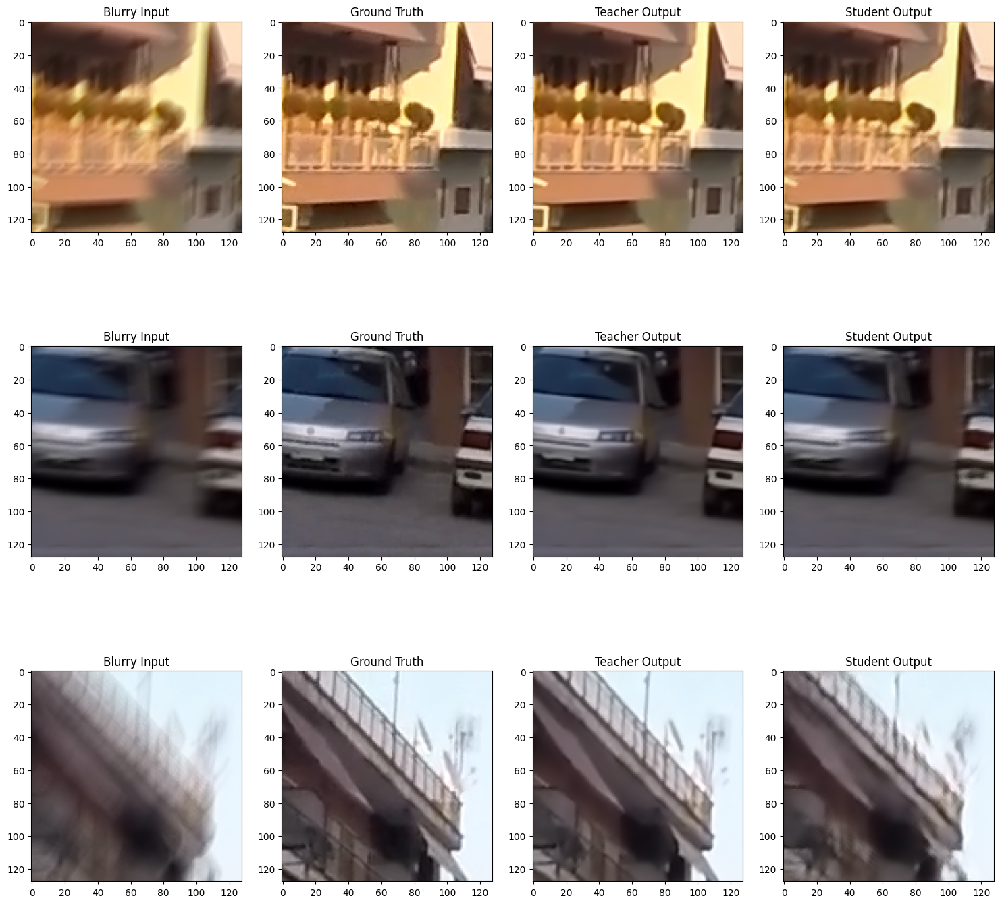


Epoch [51/100] | Time: 679.27s
  Train - Loss: 0.1057, SSIM: 0.8917, PSNR: 28.04 dB
  Val   - Loss: 0.1052, SSIM: 0.8935, PSNR: 28.04 dB
  LR: 0.000150
  --> New best validation SSIM: 0.8935

Epoch [52/100] | Time: 631.36s
  Train - Loss: 0.1051, SSIM: 0.8929, PSNR: 28.14 dB
  Val   - Loss: 0.1054, SSIM: 0.8937, PSNR: 28.03 dB
  LR: 0.000145
  --> New best validation SSIM: 0.8937

Epoch [53/100] | Time: 631.35s
  Train - Loss: 0.1043, SSIM: 0.8943, PSNR: 28.20 dB
  Val   - Loss: 0.1055, SSIM: 0.8931, PSNR: 28.01 dB
  LR: 0.000141
  Patience counter: 1/10

Epoch [54/100] | Time: 630.53s
  Train - Loss: 0.1040, SSIM: 0.8950, PSNR: 28.26 dB
  Val   - Loss: 0.1056, SSIM: 0.8932, PSNR: 28.00 dB
  LR: 0.000136
  Patience counter: 2/10

Epoch [55/100] | Time: 628.13s
  Train - Loss: 0.1036, SSIM: 0.8958, PSNR: 28.31 dB
  Val   - Loss: 0.1054, SSIM: 0.8934, PSNR: 28.03 dB
  LR: 0.000131
  Patience counter: 3/10

Epoch [56/100] | Time: 631.61s
  Train - Loss: 0.1032, SSIM: 0.8964, PSNR: 28.36 

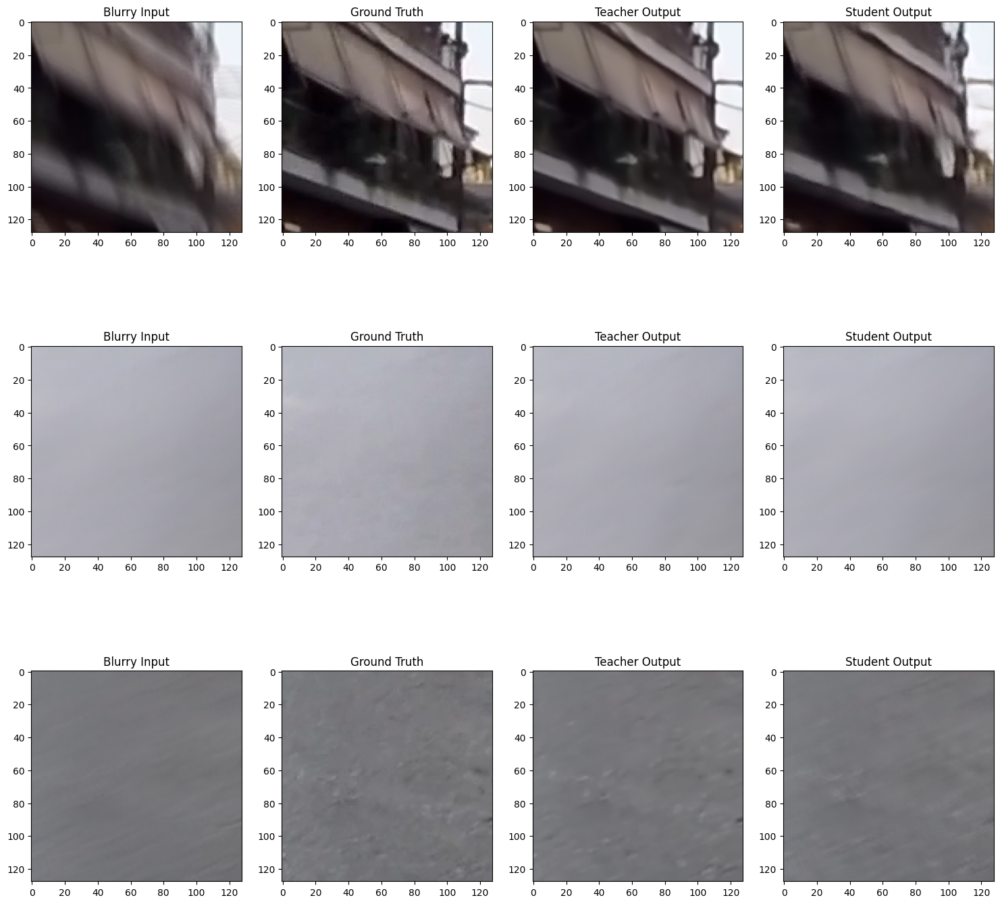


Epoch [61/100] | Time: 633.09s
  Train - Loss: 0.1018, SSIM: 0.8992, PSNR: 28.52 dB
  Val   - Loss: 0.1055, SSIM: 0.8928, PSNR: 27.99 dB
  LR: 0.000104
  Patience counter: 9/10

Epoch [62/100] | Time: 630.21s
  Train - Loss: 0.1015, SSIM: 0.8997, PSNR: 28.55 dB
  Val   - Loss: 0.1055, SSIM: 0.8928, PSNR: 27.99 dB
  LR: 0.000099
  Patience counter: 10/10
Early stopping triggered after 62 epochs

BENCHMARK EVALUATION
FINAL BENCHMARK RESULTS:
  SSIM: 0.8978
  PSNR: 28.43 dB
Total training time: 127.6 minutes


In [ ]:
import torch
import torch.nn.functional as F
from pytorch_msssim import SSIM
import matplotlib.pyplot as plt
import numpy as np
import time
from torch.utils.data import DataLoader

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
ssim_loss = SSIM(data_range=1.0, size_average=True).to(device)
perceptual_loss = VGGPerceptualLoss().to(device)

def gradient_loss(pred, target):
    pred_grad_x = pred[:, :, :, 1:] - pred[:, :, :, :-1]
    pred_grad_y = pred[:, :, 1:, :] - pred[:, :, :-1, :]
    target_grad_x = target[:, :, :, 1:] - target[:, :, :, :-1]
    target_grad_y = target[:, :, 1:, :] - target[:, :, :-1, :]
    return F.l1_loss(pred_grad_x, target_grad_x) + F.l1_loss(pred_grad_y, target_grad_y)

def charbonnier_loss(pred, target, eps=1e-3):
    return torch.mean(torch.sqrt((pred - target) ** 2 + eps ** 2))

def psnr(pred, target, max_val=1.0):
    mse = torch.mean((pred - target) ** 2)
    if mse == 0:
        return float('inf')
    return 20 * torch.log10(max_val / torch.sqrt(mse))

def high_frequency_loss(pred, target):
    pred_hf = pred - F.avg_pool2d(pred, kernel_size=3, stride=1, padding=1)
    target_hf = target - F.avg_pool2d(target, kernel_size=3, stride=1, padding=1)
    return F.l1_loss(pred_hf, target_hf)

def visualize_results(blurry, sharp, teacher_out, student_out, num_samples=3):
    plt.figure(figsize=(15, 5*num_samples))
    for i in range(num_samples):
        plt.subplot(num_samples, 4, 4*i+1)
        plt.imshow(blurry[i].permute(1,2,0).cpu().numpy())
        plt.title("Blurry Input")
        plt.subplot(num_samples, 4, 4*i+2)
        plt.imshow(sharp[i].permute(1,2,0).cpu().numpy())
        plt.title("Ground Truth")
        plt.subplot(num_samples, 4, 4*i+3)
        plt.imshow(teacher_out[i].permute(1,2,0).cpu().numpy())
        plt.title("Teacher Output")
        plt.subplot(num_samples, 4, 4*i+4)
        plt.imshow(student_out[i].permute(1,2,0).detach().cpu().numpy())
        plt.title("Student Output")
    plt.tight_layout()
    plt.show()

num_epochs = 100
optimizer = torch.optim.Adam(student_model.parameters(), lr=3e-4)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=num_epochs)

best_val_ssim = 0.0
patience = 10
patience_counter = 0

resume = True
if resume:
    checkpoint = torch.load('/kaggle/input/best-student/best_student_checkpoint.pth')
    student_model.load_state_dict(checkpoint['model_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    scheduler.load_state_dict(checkpoint['scheduler_state_dict'])
    best_val_ssim = checkpoint['best_val_ssim']
    start_epoch = checkpoint['epoch'] + 1
    print(f"Resuming training from epoch {start_epoch} with best SSIM = {best_val_ssim:.4f}")
else:
    start_epoch = 0

print(f'Train batches: {len(train_loader)}')
print(f'Validation batches: {len(test_loader)}')
print(f'Benchmark batches: {len(benchmark_loader)}')

start_time = time.time()

for epoch in range(start_epoch, num_epochs):
    epoch_start = time.time()
    student_model.train()
    train_loss = train_ssim = train_psnr = train_batches = 0.0

    for batch_idx, (blurry, sharp) in enumerate(train_loader):
        blurry = blurry.to(device)
        sharp = sharp.to(device)

        with torch.no_grad():
            teacher_output, teacher_feats = teacher_model(blurry, return_features=True)

        student_output, student_feats = student_model(blurry, return_features=True)

        if batch_idx == 0 and epoch % 10 == 0:
            visualize_results(blurry, sharp, teacher_output, student_output)

        char_gt = charbonnier_loss(student_output, sharp)
        ssim_gt = 1 - ssim_loss(student_output, sharp)
        perc_gt = perceptual_loss(student_output, sharp)
        char_teacher = charbonnier_loss(student_output, teacher_output)
        edge_gt = gradient_loss(student_output, sharp)
        hf_loss = high_frequency_loss(student_output, sharp)

        feat_distill_loss = (
            F.mse_loss(student_feats["enc1"], teacher_feats["enc1"]) +
            F.mse_loss(student_feats["enc2"], teacher_feats["enc2"]) +
            F.mse_loss(student_feats["enc3"], teacher_feats["enc3"]) +
            F.mse_loss(student_feats["dec1"], teacher_feats["dec1"]) +
            F.mse_loss(student_feats["dec2"], teacher_feats["dec2"])
        )

        loss = (
            0.10 * char_teacher +
            0.25 * char_gt +
            0.25 * ssim_gt +
            0.25 * perc_gt +
            0.10 * edge_gt +
            0.05 * hf_loss +
            0.15 * feat_distill_loss
        )

        optimizer.zero_grad()
        loss.backward()
        torch.nn.utils.clip_grad_norm_(student_model.parameters(), max_norm=0.1)
        optimizer.step()

        ssim_score = ssim_loss(student_output, sharp).item()
        psnr_score = psnr(student_output, sharp).item()

        train_ssim += ssim_score
        train_psnr += psnr_score
        train_batches += 1
        train_loss += loss.item()

    student_model.eval()
    val_loss = val_ssim = val_psnr = val_batches = 0.0

    with torch.no_grad():
        for blurry, sharp in test_loader:
            blurry = blurry.to(device)
            sharp = sharp.to(device)

            teacher_output, teacher_feats = teacher_model(blurry, return_features=True)
            student_output, student_feats = student_model(blurry, return_features=True)

            char_gt = charbonnier_loss(student_output, sharp)
            ssim_gt = 1 - ssim_loss(student_output, sharp)
            perc_gt = perceptual_loss(student_output, sharp)
            char_teacher = charbonnier_loss(student_output, teacher_output)
            edge_gt = gradient_loss(student_output, sharp)
            hf_loss = high_frequency_loss(student_output, sharp)

            feat_distill_loss = (
                F.mse_loss(student_feats["enc1"], teacher_feats["enc1"]) +
                F.mse_loss(student_feats["enc2"], teacher_feats["enc2"]) +
                F.mse_loss(student_feats["enc3"], teacher_feats["enc3"]) +
                F.mse_loss(student_feats["dec1"], teacher_feats["dec1"]) +
                F.mse_loss(student_feats["dec2"], teacher_feats["dec2"])
            )

            loss = (
                0.10 * char_teacher +
                0.25 * char_gt +
                0.25 * ssim_gt +
                0.25 * perc_gt +
                0.10 * edge_gt +
                0.05 * hf_loss +
                0.15 * feat_distill_loss
            )

            ssim_score = ssim_loss(student_output, sharp).item()
            psnr_score = psnr(student_output, sharp).item()

            val_ssim += ssim_score
            val_psnr += psnr_score
            val_batches += 1
            val_loss += loss.item()

    avg_train_loss = train_loss / train_batches
    avg_train_ssim = train_ssim / train_batches
    avg_train_psnr = train_psnr / train_batches
    avg_val_loss = val_loss / val_batches
    avg_val_ssim = val_ssim / val_batches
    avg_val_psnr = val_psnr / val_batches

    epoch_time = time.time() - epoch_start
    print(f'\nEpoch [{epoch+1}/{num_epochs}] | Time: {epoch_time:.2f}s')
    print(f'  Train - Loss: {avg_train_loss:.4f}, SSIM: {avg_train_ssim:.4f}, PSNR: {avg_train_psnr:.2f} dB')
    print(f'  Val   - Loss: {avg_val_loss:.4f}, SSIM: {avg_val_ssim:.4f}, PSNR: {avg_val_psnr:.2f} dB')
    print(f'  LR: {scheduler.get_last_lr()[0]:.6f}')

    scheduler.step()

    if avg_val_ssim > best_val_ssim:
        best_val_ssim = avg_val_ssim
        patience_counter = 0
        torch.save({
            'epoch': epoch,
            'model_state_dict': student_model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'best_val_ssim': best_val_ssim
        }, 'best_student_checkpoint.pth')
        print(f'  --> New best validation SSIM: {best_val_ssim:.4f}')
    else:
        patience_counter += 1
        print(f'  Patience counter: {patience_counter}/{patience}')

    if patience_counter >= patience:
        print(f'Early stopping triggered after {epoch+1} epochs')
        break

print("\n" + "="*100)
print("BENCHMARK EVALUATION")
print("="*100)

student_model.load_state_dict(torch.load('best_student_checkpoint.pth')['model_state_dict'])
student_model.eval()

benchmark_ssim = benchmark_psnr = benchmark_batches = 0.0

with torch.no_grad():
    for blurry, sharp in benchmark_loader:
        blurry = blurry.to(device)
        sharp = sharp.to(device)

        student_output = student_model(blurry)[0] if isinstance(student_model(blurry), tuple) else student_model(blurry)

        ssim_score = ssim_loss(student_output, sharp).item()
        psnr_score = psnr(student_output, sharp).item()

        benchmark_ssim += ssim_score
        benchmark_psnr += psnr_score
        benchmark_batches += 1

avg_benchmark_ssim = benchmark_ssim / benchmark_batches
avg_benchmark_psnr = benchmark_psnr / benchmark_batches

print(f'FINAL BENCHMARK RESULTS:')
print(f'  SSIM: {avg_benchmark_ssim:.4f}')
print(f'  PSNR: {avg_benchmark_psnr:.2f} dB')
print(f'Total training time: {(time.time() - start_time)/60:.1f} minutes')